In [1]:
import pandas as pd
import numpy as np
import seaborn as sns 
import os
import re

from matplotlib import pyplot as plt
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.neural_network import MLPClassifier

from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import make_pipeline

from sklearn import preprocessing
from sklearn.manifold import TSNE



In [2]:
font = {'family': 'sans-serif', 'weight': 'heavy','size': 7,}

def most_informative_feature_for_class(vectorizer, classifier, classlabel, n=10):
    for labelid in classlabel:
        feature_names = vectorizer.get_feature_names_out()
        top_n = sorted(zip(classifier.feature_log_prob_[labelid], feature_names), reverse=True)[:n]
        for coef, feat in top_n:
            print("SDG {} : {:30}  {:.6}".format(labelid, feat, coef))
        print("")
def print_top_n_features(vectorizer, clf, class_labels, n=10):
    """Prints features with the highest coefficient values, per class"""
    feature_names = vectorizer.get_feature_names_out()
    for i, class_label in enumerate(class_labels):
        top_n = np.argsort(clf.feature_log_prob_[i])[::-1][:n]
        print("%s: %s" % (class_label,
              " || ".join(feature_names[j] for j in top_n)))

In [3]:
data_dir = "/Users/yingli/Development/TopicsInDataScience/"
sdg_names = pd.read_excel(data_dir + "Digital Science SDG training set searches.xlsx")
sdg_names = sdg_names.drop([0,1,2], axis=0)
sdg_names = sdg_names.set_axis(["sdg", "sdg_name", "sdg_definition"],axis=1, copy=False)

text_file_name = "osdg-community-data-v2024-04-01.csv"
text_df = pd.read_csv(data_dir + text_file_name,sep = "\t",  quotechar='"')
text_df.drop(text_df.columns.values[0],axis = 1, inplace=True)
text_df = text_df.query("agreement > 0.5 and (labels_positive - labels_negative) > 2").reset_index(drop=True)



No need to run the below cell, but left here for reference if we want to remove non-English text in our document corpus for any processing. 

In [4]:
text_df

,text_id,text,sdg,labels_negative,labels_positive,agreement
0,00021941702cd84171ff33962197ca1f,"From a gender perspective, Paulgaard points ou...",5,1,8,0.777778
1,0004eb64f96e1620cd852603d9cbe4d4,The average figure also masks large difference...,3,1,8,0.777778
2,000b54717f2deea5d99055b4c1c2bf5a,These findings are consistent with previous wo...,10,2,7,0.555556
3,000bfb17e9f3a00d4515ab59c5c487e7,The Israel Oceanographic and Limnological Rese...,6,0,3,1.000000
4,001180f5dd9a821e651ed51e30d0cf8c,Previous chapters have discussed ways to make ...,2,0,3,1.000000
...,...,...,...,...,...,...
26521,ffeb4e2b3d0f4d449053b1b15f51e4eb,"In Mauritius, housing development for the econ...",11,1,10,0.818182
26522,ffef3ec4ea192cdfed2ca43d4b2208a9,"In consequence, the number of urban dwellers p...",3,0,11,1.000000
26523,fff9b6b75bde5397ba26ed1b163ad306,"It also features individual accountability, wh...",4,0,9,1.000000
26524,fffe58dae29de6b843aff09b6e2f77f0,Groundwater quality can also be affected by co...,6,0,3,1.000000


In [5]:
sdg_names

,sdg,sdg_name,sdg_definition
3,1,No Poverty,End poverty in all its forms everywhere
4,2,Zero Hunger,"End hunger, achieve food security and improved..."
5,3,Good Health and Well Being,Ensure healthy lives and promote well-being fo...
6,4,Quality Education,Ensure inclusive and equitable quality educati...
7,5,Gender Equality,Achieve gender equality and empower all women ...
8,6,Clean Water and Sanitation,Ensure availability and sustainable management...
9,7,Affordable and Clean Energy,"Ensure access to affordable, reliable, sustain..."
10,8,Decent Work and Economic Growth,"Promote sustained, inclusive and sustainable e..."
11,9,"Industry, Innovation and Infrastructure","Build resilient infrastructure, promote inclus..."
12,10,Reduced Inequalities,Reduce inequality within and among countries


## Using Google generative AI

- put the google genai key in an enviroment vairable 
- I called my variable "GOOGLEGENAI_KEY"
- in my .zshrc file, I added a line as 
  - export GOOGLEGENAI_KEY=abcdefghijklmnopqrstuvwxyz
  - then use the genai.configure(api_key=...) to set the key in python run time.
  - https://phoenixnap.com/kb/set-environment-variable-mac
  - https://www3.ntu.edu.sg/home/ehchua/programming/howto/Environment_Variables.html

- or use a separate file, call it my_key.py, and put this line in it:
  - GOOGLEGENAI_KEY = "abcdefghijklmnopqrestuvwxyz"
  - put my_key.env in .ignore file so that you don't commit you api key into github
  - then in python notebook, import my_key.py and assign the key value
    - import my_key
    - genai.configure(api_key=my_key.GOOGLEGENAI_KEY)

as in the below cell

In [6]:
import google.generativeai as genai
import os
import tqdm as notebook_tqdm

#genai.configure(api_key = "abcdefghijklmnopqrestuvwxyz") # avoid doing this
genai.configure(api_key=os.environ["GOOGLEGENAI_KEY"])

/opt/anaconda3/envs/nlp/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Test if the api key is properly set. Below is an example from google, using the gemini-1.5-flash model for task of text generation.

In [7]:
model = genai.GenerativeModel("gemini-1.5-flash")
response = model.generate_content("Write a story about a magic backpack.")
print(response.text)

Elara wasn't your average twelve-year-old.  While other kids dreamed of ponies and pop stars, Elara dreamt of unexplored jungles and forgotten cities.  Her dreams, however, were perpetually hampered by a crippling lack of funds and equally crippling parental anxieties about her adventurous spirit.  That is, until she found *it*.

It wasn't glittering or obviously magical.  It was a plain, olive-green canvas backpack, tucked away in the dusty attic of her grandmother's house.  Its only distinguishing feature was a small, tarnished silver clasp shaped like a coiled serpent.  Curiosity overriding caution, Elara snapped it open.

Inside, the backpack was surprisingly spacious.  But that wasn't the surprising part.  As she reached in, her hand brushed against something soft.  She pulled out a perfectly ripe mango.  Elara hadn’t packed a mango.  She’d had toast for breakfast.

Over the next few days, the backpack’s magic became apparent.  Need a pencil?  It appeared.  A compass?  There it wa

### Obtaining embedding from google API

We can test embedding, start with one text excerpts from our corpus. Specify task as "classification" for us to use the embedding as features to build classifier. 

All google genai models produce an output with 768 dimensions by default. 

In [8]:
result = genai.embed_content(
    model="models/text-embedding-004",
    content=text_df.text[0], #"What is the meaning of life?",
    task_type="classification")

# 1 input of text excerpt, produce 1 vector output
print(text_df.text[0])
print(str(result['embedding'])[:50], '... TRIMMED]')

From a gender perspective, Paulgaard points out that the labour markets of the fishing villages have been highly gender-segregated in terms of the existence of "male jobs" and "female jobs", however, the new business opportunities have led to the male population of the peripheral areas now working in the service industry in former "female jobs": "That boys and girls are doing the same jobs indicates change, because traditional boundaries between women and men's work are being crossed. But the fact that young people are still working represents continuity with the past" (Paulgaard 2002: 102). When Paulgaard refers to continuity with traditions, she refers to the expectations of young adults to participate in adult culture, thus these fishing villages traditionally have no actual youth culture. As described earlier, Paulgaard (2015) concludes that in some of Norway's peripheral areas school is still 'foreign', a time waster stealing time from young adults who should instead spend their t

- This below cell took 80 minutes to run on my laptop, calling the google API. 
- I ran the code to generate the embedding for each of our text_df excerpt, and stored the resulting numpy array in a file (binary file), named 'genai_embedding_feature_20241118.npy'. 
- you can get this file from my drive (163 MB): https://drive.google.com/file/d/1pCo7kEETI4RUVicF9I2_0xWme2IFEdCH/view?usp=drive_link 


In [9]:
corpus = text_df.text
genai_model ="models/text-embedding-004"
embedding_feature = np.load('genai_embedding_feature_20241118.npy', allow_pickle = True)

In [10]:
embedding_feature.shape, text_df.shape

((26526, 768), (26526, 6))

In [11]:
embedding_feature

array([[-0.0090568 ,  0.00968024, -0.05529688, ..., -0.03952224,
         0.0677777 , -0.04204174],
       [ 0.01338374,  0.00136226, -0.02923584, ..., -0.03741065,
         0.07439171, -0.03715031],
       [ 0.00636333,  0.0199444 , -0.05127087, ..., -0.04551102,
         0.05157886, -0.02406187],
       ...,
       [ 0.00705975,  0.01408093, -0.03805666, ..., -0.02920205,
         0.06430979, -0.03103669],
       [ 0.01816972,  0.00548759, -0.05118626, ..., -0.04050171,
         0.04637956, -0.06539301],
       [-0.02273719,  0.00813141, -0.05563591, ..., -0.03717886,
         0.07077095, -0.02011792]])

In [12]:
corpus = text_df.text
X = embedding_feature
sdg_num = text_df.sdg
X_train, X_test, y_train, y_test = \
    train_test_split(X, sdg_num, test_size=0.33, random_state=7)

In [13]:
X_train.shape, X_test.shape

((17772, 768), (8754, 768))

In [14]:
scaler = preprocessing.StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

use_mlp_clf = MLPClassifier(random_state=1, max_iter=500, hidden_layer_sizes=(300,))\
    .fit(X_train_scaled, y_train)
y_pred = use_mlp_clf.predict(X_test_scaled)
print(metrics.classification_report(y_test,y_pred, digits = 4))


              precision    recall  f1-score   support

           1     0.8333    0.7732    0.8021       485
           2     0.8474    0.8700    0.8586       300
           3     0.9261    0.9580    0.9418       667
           4     0.9394    0.9362    0.9378       878
           5     0.9145    0.9631    0.9382       922
           6     0.9340    0.9115    0.9226       497
           7     0.8823    0.9310    0.9060       652
           8     0.7079    0.6000    0.6495       315
           9     0.8590    0.8770    0.8679       618
          10     0.7266    0.7445    0.7354       407
          11     0.8858    0.8634    0.8745       476
          12     0.8411    0.8127    0.8267       267
          13     0.9070    0.8405    0.8725       464
          14     0.9377    0.9275    0.9326       276
          15     0.9089    0.9254    0.9171       496
          16     0.9818    0.9894    0.9855      1034

    accuracy                         0.8950      8754
   macro avg     0.8770   

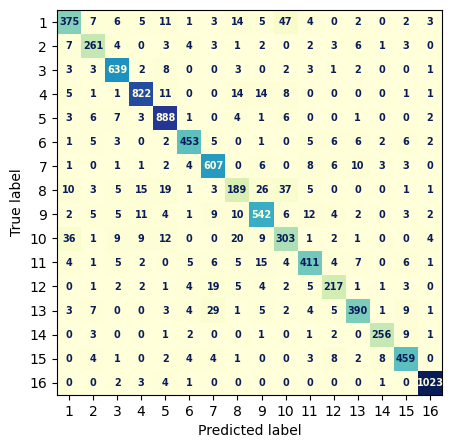

In [15]:
fig, ax = plt.subplots(figsize=(15, 5))
font = {'family': 'sans-serif', 'weight': 'heavy','size': 7,}
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, text_kw=font, ax=ax, cmap=plt.colormaps["YlGnBu"],colorbar=None)

### using TSNE

t-SNE (t-distributed Stochastic Neighbor Embedding) is an unsupervised non-linear dimensionality reduction technique for data exploration and visualizing high-dimensional data. 

https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html



In [16]:
tsne = TSNE(2, verbose=0, perplexity=50)
tsne_proj = tsne.fit_transform(X_test_scaled)

 - plot selected SDGs on 2D

/var/folders/j8/w88cxj05115byx3n9mnk572w0000gn/T/ipykernel_70184/1294351289.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20')
/var/folders/j8/w88cxj05115byx3n9mnk572w0000gn/T/ipykernel_70184/1294351289.py:7: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(tsne_proj[indices,0],tsne_proj[indices,1], c=cmap(lab), label = lab ,alpha=0.7,s=5)


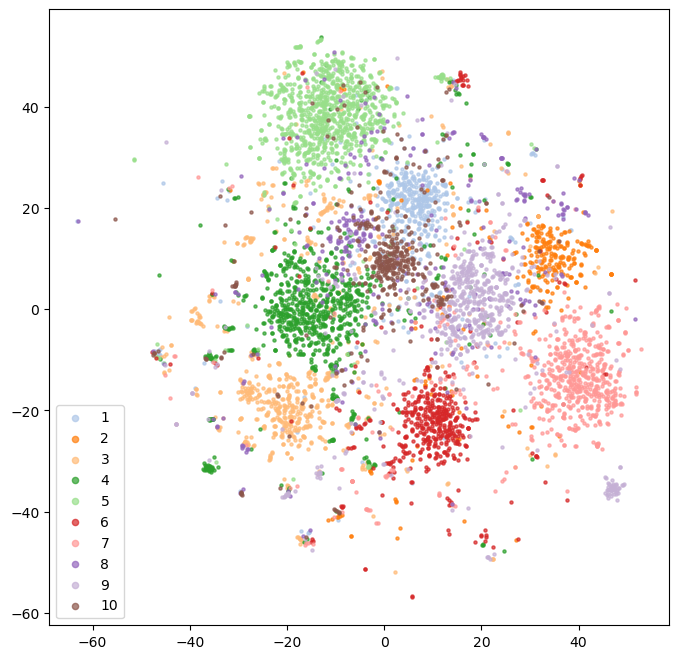

In [17]:
from matplotlib import cm
cmap = cm.get_cmap('tab20')
fig, ax = plt.subplots(figsize=(8,8))
sdg = [1,2,3,4,5,6,7,8,9,10]
for lab in sdg:
    indices = y_test==lab
    ax.scatter(tsne_proj[indices,0],tsne_proj[indices,1], c=cmap(lab), label = lab ,alpha=0.7,s=5)
ax.legend(markerscale=2)
plt.show()

/var/folders/j8/w88cxj05115byx3n9mnk572w0000gn/T/ipykernel_70184/571748599.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20')
/var/folders/j8/w88cxj05115byx3n9mnk572w0000gn/T/ipykernel_70184/571748599.py:7: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(tsne_proj[indices,0],tsne_proj[indices,1], c=cmap(lab), label = lab ,alpha=0.7,s=5)


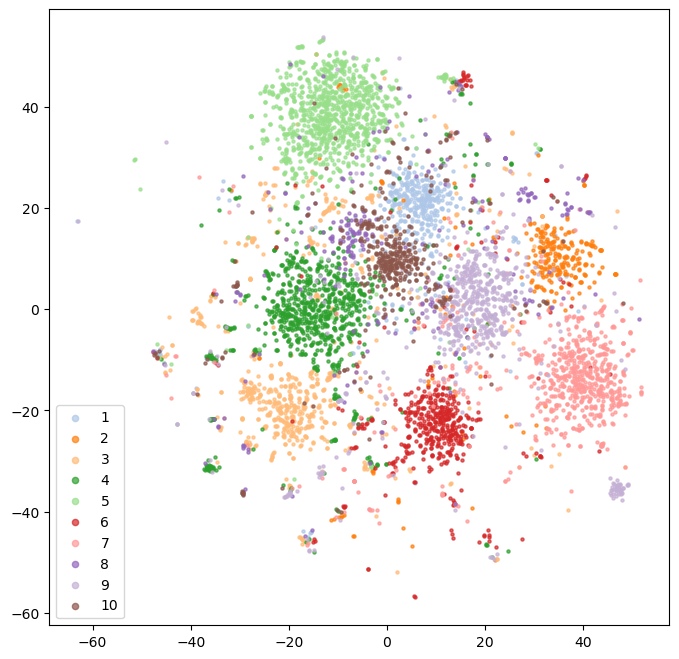

In [18]:
from matplotlib import cm
cmap = cm.get_cmap('tab20')
fig, ax = plt.subplots(figsize=(8,8))
sdg = [1,2,3,4,5,6,7,8,9,10]
for lab in sdg:
    indices = y_pred==lab
    ax.scatter(tsne_proj[indices,0],tsne_proj[indices,1], c=cmap(lab), label = lab ,alpha=0.7,s=5)
ax.legend(markerscale=2)
plt.show()

In [19]:
for i in range(1):
    size = 300 + i*10
    use_mlp_clf = MLPClassifier(random_state=1, max_iter=300, hidden_layer_sizes=(size,)).fit(X_train_scaled, y_train)
    y_pred = use_mlp_clf.predict(X_test_scaled)
    print("macro-averaged precision for {} = {:.4}".format(size, metrics.precision_score(y_test, y_pred, average = 'macro')))

macro-averaged precision for 300 = 0.877


In [20]:
for solver in ['lbfgs', 'sgd', 'adam']:
    size = 300
    use_mlp_clf = MLPClassifier(random_state=1, max_iter=100, hidden_layer_sizes=(size,), solver = solver).fit(X_train_scaled, y_train)
    y_pred = use_mlp_clf.predict(X_test_scaled)
    print("macro-averaged precision for {} = {:.4}".format(solver, metrics.precision_score(y_test, y_pred, average = 'macro')))

macro-averaged precision for lbfgs = 0.8566


/opt/anaconda3/envs/nlp/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


macro-averaged precision for sgd = 0.8689
macro-averaged precision for adam = 0.877


In [21]:
#size = (300, 100, )
for size in iter(zip([300, 400, 500, 600], [200, 200, 300, 300])):
    use_mlp_clf = MLPClassifier(random_state=1, max_iter=500, hidden_layer_sizes=size).fit(X_train_scaled, y_train)
    y_pred = use_mlp_clf.predict(X_test_scaled)
    print("macro-averaged precision for {} = {:.4}".format(size, metrics.precision_score(y_test, y_pred, average = 'macro')))

macro-averaged precision for (300, 200) = 0.8712
macro-averaged precision for (400, 200) = 0.877
macro-averaged precision for (500, 300) = 0.8829
macro-averaged precision for (600, 300) = 0.8789


macro-averaged precision for (300, 100) = 0.7987
macro-averaged precision for (300, 200) = 0.7936
macro-averaged precision for (400, 200) = 0.8078
macro-averaged precision for (500, 300) = 0.8036
macro-averaged precision for (600, 300) = 0.8058

 - classification based on document embedding
 - max_iter = 100: 0.8326
 - max_iter = 100, hidden_layer_size = (100, 70): 0.8170
 - max_iter = 100, hidden_layer = (200,): 0.7885
 - max_iter = 100, hidden_layer = 
  - 30: 0.7985
  - 40: 0.7986 
   - solver = lbfgs: 0.7912
   - sgd: 0.5764
   - adam:0.7986
  - 50: 0.7974
  - 60: 0.7945
  - 70: 0.7963
  - 80: 0.7859
  - 90: 0.7907
  - 100:0.789
  - 110: 0.7875
  - 120: 0.7869
  - 130: 0.7844
 - max_iter = 100, hidden_layer = (850,): 0.7982 
 - max_iter = 100, hidden_layer = (150,): 0.788 


### getting embeddings at sentence level
 - setting up nltk tokenizer
 - use nltk to segment document into sentences, and embed each sentence
 - or embed the document (as a short paragraph) directly

In [22]:
import nltk.data
from nltk import word_tokenize, sent_tokenize

s1 = sent_tokenize(text_df.text[1357]) # pick a ramdom text to check

embedding_s1_list = []
for i in range(len(s1)):
    embedding_result = genai.embed_content(
        model = genai_model,
        content=s1[i],
        task_type="classification")
    embedding_s1_list.append(embedding_result['embedding'])
embedding_s1_feature = np.stack(embedding_s1_list)
print(s1)
embedding_s1_feature

['Without taking a position on centralization versus decentralization, this chapter reviews the local governance system in the Kingdom of Saudi Arabia.', 'The chapter alleges that local government hierarchies in Saudi Arabia seem to suggest a higher degree of decentralization, while the actual separation of powers between local and national levels of government suggests a high degree of centralization.', 'This raises questions about electoral politics at the local level—where little power resides.', 'This chapter provides a thorough background on Saudi demographic, political, administrative, and economic conditions.', 'Then, it considers the issues that are specific to local governance including local government structure and organization.', 'The final section addresses the main claim of this chapter about the effectiveness of local governance in Saudi Arabia and makes some recommendations.']


array([[-0.00734861,  0.02133271, -0.00806571, ..., -0.03049171,
         0.06565286, -0.02608105],
       [ 0.01515661,  0.01761412, -0.03685555, ..., -0.0266067 ,
         0.06000064, -0.05097305],
       [ 0.00991927, -0.01093667, -0.02419079, ..., -0.03474188,
         0.05633339, -0.03677552],
       [-0.00597164,  0.01777447, -0.01502573, ..., -0.03641222,
         0.07772142, -0.01754851],
       [ 0.00359862,  0.01970316, -0.02204326, ..., -0.04277936,
         0.07418793, -0.05251927],
       [-0.00087838,  0.05127505,  0.00564087, ..., -0.01076133,
         0.0719805 , -0.02127777]])

- this above use an NLTK built-in tokenizer (sentence breaker, or word breaker)
- one could train a tokenizer, by using nltk function PunktSentenceTokenizer 
- this one below load a pre-trained tokenizer model, trained by PunktSentenceTokenizer

### break all document into sentences
* repeat the SDG label of the document onto its sentences
*  [sdg]*len(sentence)

In [23]:
text_df_sentence = []
text_df_sdg = []
for (text, sdg) in iter(zip(text_df.text, text_df.sdg)):
    sentence = sent_tokenize(text) 
    text_df_sentence = text_df_sentence + sentence
    text_df_sdg = text_df_sdg + [sdg]*len(sentence)
sentence_df = pd.DataFrame({"text": text_df_sentence, "sdg": text_df_sdg})

In [24]:
text_df.shape, sentence_df.shape

((26526, 6), (99477, 2))

 - verify by doing a sentence break and sum up the length

In [25]:
text_df.text.apply(lambda x: len(sent_tokenize(x))).sum()

99477

 - almost all documents have less than 10 sentences

In [26]:
text_df["num_sent"] = text_df.text.apply(lambda x: len(sent_tokenize(x)))
text_df["num_sent"].value_counts()

num_sent
3     13041
4      8178
5      2384
6      1672
2       603
7       360
8       122
1        90
9        22
10       16
12       11
15        6
13        6
11        3
14        3
16        3
17        2
18        1
24        1
21        1
20        1
Name: count, dtype: int64

- use sentence_df to prepare data for classification
- build sentence level embedding

This below cell call googlegenai embedding model for all 99,477 sentences in our corpus. It took 337 minutes to run on my laptop, mostly due to API call timing. 

Reading back the embedding from the stored file.

In [27]:
corpus = sentence_df.text
sdg_num = sentence_df.sdg
sentence_embedding_feature  = np.load('genai_sentence_embedding_feature_20241120.npy', allow_pickle = True)

In [28]:
X = sentence_embedding_feature
X_train, X_test, y_train, y_test = \
    train_test_split(X, sdg_num, test_size=0.33, random_state=7)

### using the sentence embedding vectors for classification
 - not quite making sense because the document label of SDG is for the whole excerpts, depend on the collection of the sentences in each excerpts
 - individual sentences taking the document labels will introduce noises.

 training a MLP classifier on the sentence embedding collection takes longer now. Below cell took 2 minute to train.

In [29]:
scaler = preprocessing.StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

use_mlp_clf = MLPClassifier(random_state=1, max_iter=500, hidden_layer_sizes=(300,))\
    .fit(X_train_scaled, y_train)
y_pred = use_mlp_clf.predict(X_test_scaled)
print(metrics.classification_report(y_test,y_pred, digits = 4))

              precision    recall  f1-score   support

           1     0.6291    0.6053    0.6170      1743
           2     0.6352    0.6678    0.6511      1210
           3     0.8047    0.7829    0.7936      2326
           4     0.7881    0.8170    0.8023      3114
           5     0.7554    0.7637    0.7595      3275
           6     0.7072    0.7032    0.7052      1752
           7     0.7263    0.7305    0.7284      2557
           8     0.4510    0.4131    0.4312      1191
           9     0.6514    0.6580    0.6547      2295
          10     0.5136    0.5014    0.5074      1432
          11     0.6390    0.6850    0.6612      1762
          12     0.5805    0.5827    0.5816       798
          13     0.6650    0.6498    0.6573      1622
          14     0.7359    0.7552    0.7454       915
          15     0.7475    0.7133    0.7300      1810
          16     0.9047    0.9027    0.9037      5026

    accuracy                         0.7248     32828
   macro avg     0.6834   

As expected, the classifier has lower accuracy compared with the document (excerpts) level classification.

In [30]:
tsne = TSNE(2, verbose=0, perplexity=50)
tsne_proj = tsne.fit_transform(X_test_scaled)

 - plot selected SDGs on 2D

/var/folders/j8/w88cxj05115byx3n9mnk572w0000gn/T/ipykernel_70184/1294351289.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20')
/var/folders/j8/w88cxj05115byx3n9mnk572w0000gn/T/ipykernel_70184/1294351289.py:7: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(tsne_proj[indices,0],tsne_proj[indices,1], c=cmap(lab), label = lab ,alpha=0.7,s=5)


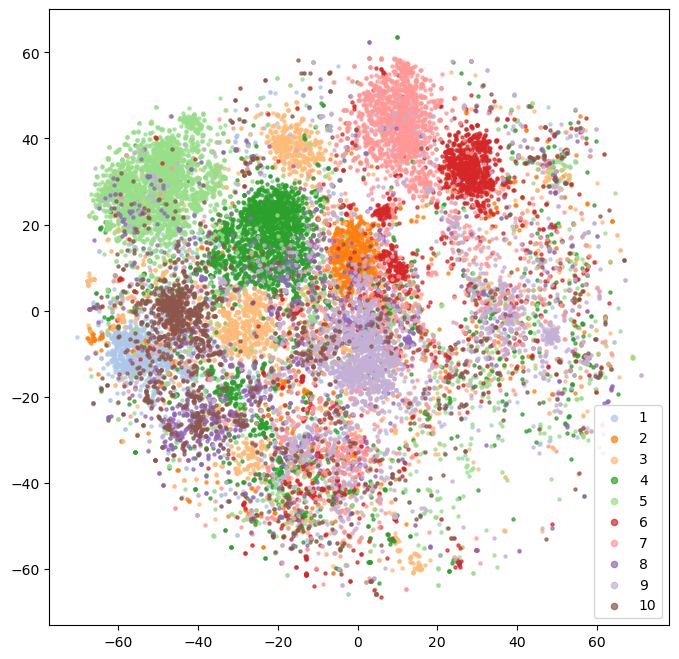

In [31]:
from matplotlib import cm
cmap = cm.get_cmap('tab20')
fig, ax = plt.subplots(figsize=(8,8))
sdg = [1,2,3,4,5,6,7,8,9,10]
for lab in sdg:
    indices = y_test==lab
    ax.scatter(tsne_proj[indices,0],tsne_proj[indices,1], c=cmap(lab), label = lab ,alpha=0.7,s=5)
ax.legend(markerscale=2)
plt.show()

* plot with y_pred class labels

/var/folders/j8/w88cxj05115byx3n9mnk572w0000gn/T/ipykernel_70184/297862293.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20')
/var/folders/j8/w88cxj05115byx3n9mnk572w0000gn/T/ipykernel_70184/297862293.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(tsne_proj[indices,0],tsne_proj[indices,1], c=cmap(lab), label = lab ,alpha=0.7,s=10)


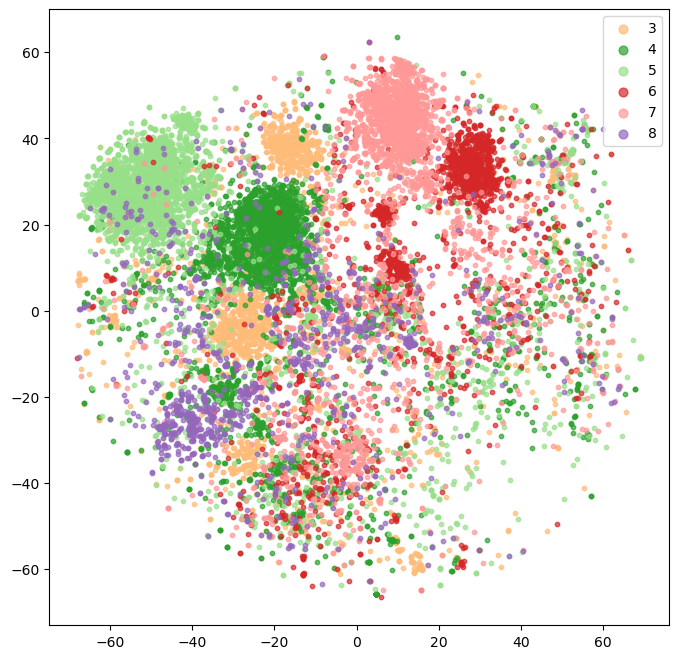

In [32]:
cmap = cm.get_cmap('tab20')
fig, ax = plt.subplots(figsize=(8,8))
num_categories = [3,4,5,6,7,8]
for lab in num_categories:
    indices = y_pred==lab
    ax.scatter(tsne_proj[indices,0],tsne_proj[indices,1], c=cmap(lab), label = lab ,alpha=0.7,s=10)
ax.legend(markerscale=2)
plt.show()

In [33]:
import nltk.data
text = """
    Punkt knows that the periods in Mr. Smith and Johann S. Bach do not 
    mark sentence boundaries.  And sometimes sentences can start with non-capitalized words.  
    i is a good variable name.
"""
sent_tokenize(text)

['\n    Punkt knows that the periods in Mr. Smith and Johann S. Bach do not \n    mark sentence boundaries.',
 'And sometimes sentences can start with non-capitalized words.',
 'i is a good variable name.']

In [34]:
tokenizer = nltk.data.load('tokenizers/punkt/english.pickle')
tokenizer.tokenize(text.strip())

['Punkt knows that the periods in Mr. Smith and Johann S. Bach do not \n    mark sentence boundaries.',
 'And sometimes sentences can start with non-capitalized words.',
 'i is a good variable name.']

In [35]:
from nltk import word_tokenize, sent_tokenize
corpus_str = corpus.str.cat()
corpus_tokens = word_tokenize(corpus_str)
len(corpus_tokens), len(set(corpus_tokens))

(2670515, 125930)

In [36]:
from nltk import collocations
fd = collocations.FreqDist(corpus_tokens)
fd.most_common(30)

[(',', 140392),
 ('the', 135236),
 ('of', 101798),
 ('and', 99508),
 ('to', 67993),
 ('in', 63131),
 ('a', 35350),
 ('for', 29732),
 ('(', 28134),
 (')', 27107),
 ('is', 26904),
 ('that', 21484),
 ('are', 19494),
 ('on', 18873),
 ('as', 18411),
 ('with', 14662),
 ('by', 14544),
 ('be', 13452),
 ('from', 10211),
 ('have', 9761),
 ('or', 9650),
 ('has', 8092),
 ('not', 7977),
 ('an', 7883),
 ('this', 7877),
 ('their', 7617),
 ('also', 7528),
 ('which', 7436),
 ('at', 7362),
 ('’', 7307)]

In [37]:
measures = collocations.BigramAssocMeasures()
c = collocations.BigramCollocationFinder.from_words(corpus_tokens)
c.nbest(measures.pmi,100)

[("'Camikavas", 'negi'),
 ("'Necessary", 'Thickening'),
 ("'PES-like", "fashion'and"),
 ("'Paris", "rulebook'.This"),
 ("'any", 'electrically'),
 ("'ex", 'turpi'),
 ("'family", "values'.To"),
 ("'nine", 'gems'),
 ("'opportunity", "cost'approach"),
 ("'procedural", "forms'.While"),
 ("'spatially", "blind'.When"),
 ("'stabilization", "wedges'.It"),
 ('-16.58', 'p.p.'),
 ('-Midia', 'Navodari.Romanian'),
 ('-at', 'times-also'),
 ('-chronically-ill', 'people-'),
 ('-red', 'ressing'),
 ('.1.Six', 'Senses'),
 ('.95.5', '95.3'),
 ('.Aftale', 'om'),
 ('.Artisanal', 'agroprocessing'),
 ('.Cadrage', 'macroeconomique'),
 ('.Cataract', 'suigery'),
 ('.Definiciones', 'Instrumentos'),
 ('.En', 'outre'),
 ('.Ernest', 'Gellner'),
 ('.Fareed', 'Zakaria'),
 ('.Globalizing', "'postsocialism"),
 ('.Indicator', '11.7.2'),
 ('.Inside', 'HUB'),
 ('.Judy', 'Halbert'),
 ('.Kata', 'Kunci'),
 ('.Laura', 'Jenks'),
 ('.Mass', 'mailings'),
 ('.Panchayat', 'raj'),
 ('.Philippe', 'Lebreton'),
 ('.Pupufe', 'Organife'),

In [38]:
c.nbest(measures.likelihood_ratio, 30)


[('’', 's'),
 ('per', 'cent'),
 ('such', 'as'),
 ('of', 'the'),
 ('in', 'the'),
 ('as', 'well'),
 ('has', 'been'),
 (')', '.The'),
 ('well', 'as'),
 ('human', 'rights'),
 (',', ','),
 ('can', 'be'),
 ('et', 'al.'),
 ('have', 'been'),
 ('based', 'on'),
 ('number', 'of'),
 ('to', 'be'),
 (',', 'which'),
 ('climate', 'change'),
 ('of', ','),
 (',', 'but'),
 ('should', 'be'),
 ('access', 'to'),
 ('on', 'the'),
 ('United', 'States'),
 (',', 'of'),
 ('it', 'is'),
 (')', '.In'),
 ('do', 'not'),
 ('example', ',')]

In [39]:
sentences = sent_tokenize(corpus_str)
sentences

['From a gender perspective, Paulgaard points out that the labour markets of the fishing villages have been highly gender-segregated in terms of the existence of "male jobs" and "female jobs", however, the new business opportunities have led to the male population of the peripheral areas now working in the service industry in former "female jobs": "That boys and girls are doing the same jobs indicates change, because traditional boundaries between women and men\'s work are being crossed.But the fact that young people are still working represents continuity with the past" (Paulgaard 2002: 102).When Paulgaard refers to continuity with traditions, she refers to the expectations of young adults to participate in adult culture, thus these fishing villages traditionally have no actual youth culture.As described earlier, Paulgaard (2015) concludes that in some of Norway\'s peripheral areas school is still \'foreign\', a time waster stealing time from young adults who should instead spend thei

In [40]:
corpus[corpus.str.contains("wp-content/uploads/2015/05/150512")]

82309    Retrieved from: http://climatepolicyinitiative...
Name: text, dtype: object

In [41]:
text_df.iloc[21940].text

'Retrieved from: http://climatepolicyinitiative.org/ wp-content/uploads/2015/05/150512 Auctions FINAL.pdf. Retrieved from: https://www.dlapiper.eom/~/media/Files/Insights/Publications/2015/04/Renewable energy in the Asia Pac.pdf. Economic Research Institute for ASEAN and East Asia, Jakarta. Retrieved from: http://economictimes.indiatimes.com/ news/politics-and-nation/indias-renewable-energy-targets-catch-the-attention-of-global-investors-still-need-ground-work/articleshow/53015707.cms. Climate Change Impacts - Southeast Asia, International Fund for Agricultural Development, https://www.ifad.org/documents/10180/41587621-d96e-4aed-8b22-e714bcecd58e. Retrieved from: http://www.nrel.gov/docs/ fV12osti/52983.pdf.'

In [42]:
corpus_str.find('wp-content/uploads/2015/05/150512')

13770652

### use sklearn make_pipeline
 - the api doc says it works with sklearn estimators, probably not work with other estimators

In [43]:
select_sdg = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
corpus = text_df.text
sdg_num = text_df.sdg
X_train, X_test, y_train, y_test = train_test_split(
    corpus, sdg_num, test_size=0.33, random_state=7)

par = [CountVectorizer(ngram_range=(1,1),stop_words='english')]

model = make_pipeline(CountVectorizer(ngram_range=(2,2), stop_words = "english" ),\
            MultinomialNB())
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print(metrics.classification_report(y_test, y_pred, digits=4))

              precision    recall  f1-score   support

           1     0.7749    0.8021    0.7882       485
           2     0.8767    0.6633    0.7552       300
           3     0.8705    0.8966    0.8833       667
           4     0.8469    0.9453    0.8934       878
           5     0.7682    0.9490    0.8491       922
           6     0.8808    0.8471    0.8636       497
           7     0.7102    0.9248    0.8035       652
           8     0.8718    0.3238    0.4722       315
           9     0.7151    0.7799    0.7461       618
          10     0.7470    0.6093    0.6712       407
          11     0.8416    0.6807    0.7526       476
          12     0.9268    0.4270    0.5846       267
          13     0.7983    0.8190    0.8085       464
          14     0.9297    0.6232    0.7462       276
          15     0.8473    0.8387    0.8430       496
          16     0.9107    0.9768    0.9426      1034

    accuracy                         0.8183      8754
   macro avg     0.8323   